# CANDIDATE APPLICATION TRACKER

### INTRODUCTION 

### LOADING THE DATASET

In [ ]:
import pandas as pd
# Load the dataset using a raw string
file_path = r"C:\Users\HP\OneDrive\Desktop\candidate Application Tracker.xlsx"
data = pd.read_excel(file_path)

In [20]:
# Removing columns that are entirely null
data.dropna(axis=1, how='all', inplace=True)
# Displaying the first few rows of the cleaned dataset
data.head()

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 133,Unnamed: 134,Unnamed: 135,Unnamed: 136,Unnamed: 137,Unnamed: 138,Unnamed: 139,Unnamed: 140,Unnamed: 141,Unnamed: 142
0,S. No.,Candidate Name,Counselor Name,Block Amount Received Date,Univ. Pitched,Lead Id,Candidate Preferred College #1,Candidate Preferred College #2,10th Percentage,12th Percentange,...,Offer Letter Submission Date,,Financials Submission,Financials Submission Date,i20 Provisioned,i20 Provisioned Date,Remarks,Status,SOP Status,
1,1,Vikash,Shailendra Singh,45152,Rutgers,NaN,Rutgers Business School,None,NaN,NaN,...,NaN,NaN,True,NaN,Received,14/03/2024,NaN,Defer Fall,NaN,NaN
2,2,Hariraj,Shailendra Singh,45188,Fairfield/DePaul,NaN,DePaul Kellstadt Graduate School of Business,None,NaN,NaN,...,NaN,NaN,False,NaN,NaN,NaN,On Hold due to CX In Hospital,Defer Fall,NaN,NaN
3,3,Thippesh,Shailendra Singh,45190,Rutgers,NaN,Rutgers Business School,None,NaN,NaN,...,NaN,NaN,True,20/02/2024,Received,20/02/2024,NaN,Defer Fall,NaN,NaN
4,4,Chintan,Shailendra Singh,45202,DePaul,NaN,DePaul Kellstadt Graduate School of Business,None,NaN,NaN,...,NaN,NaN,True,NaN,Received,28/03/2024,was On Hold due to family issues,Defer Fall (Dropped),NaN,NaN


In [21]:
# Set the first row as the header
new_header = data.iloc[0]  # Get the first row for the header
data = data[1:]  # Exclude the first row
data.columns = new_header  # Set the first row as the header

# Remove columns with "Unnamed" in their header
data = data.loc[:, ~data.columns.str.contains('^Unnamed')]

# Display information about the dataset
data.info()

# Display the first few rows to inspect
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 316 entries, 1 to 316
Columns: 143 entries, S. No. to  
dtypes: object(143)
memory usage: 353.2+ KB


,S. No.,Candidate Name,Counselor Name,Block Amount Received Date,Univ. Pitched,Lead Id,Candidate Preferred College #1,Candidate Preferred College #2,10th Percentage,12th Percentange,...,Offer Letter Submission Date,,Financials Submission,Financials Submission Date,i20 Provisioned,i20 Provisioned Date,Remarks,Status,SOP Status,
1,1,Vikash,Shailendra Singh,45152,Rutgers,NaN,Rutgers Business School,None,NaN,NaN,...,NaN,NaN,True,NaN,Received,14/03/2024,NaN,Defer Fall,NaN,NaN
2,2,Hariraj,Shailendra Singh,45188,Fairfield/DePaul,NaN,DePaul Kellstadt Graduate School of Business,None,NaN,NaN,...,NaN,NaN,False,NaN,NaN,NaN,On Hold due to CX In Hospital,Defer Fall,NaN,NaN
3,3,Thippesh,Shailendra Singh,45190,Rutgers,NaN,Rutgers Business School,None,NaN,NaN,...,NaN,NaN,True,20/02/2024,Received,20/02/2024,NaN,Defer Fall,NaN,NaN
4,4,Chintan,Shailendra Singh,45202,DePaul,NaN,DePaul Kellstadt Graduate School of Business,None,NaN,NaN,...,NaN,NaN,True,NaN,Received,28/03/2024,was On Hold due to family issues,Defer Fall (Dropped),NaN,NaN
5,5,Sagar,Shailendra Singh,45181,Rutgers,NaN,Rutgers Business School,None,NaN,NaN,...,45224,NaN,True,18/02/2024,Received,21/02/2024,NaN,Defer Fall,NaN,NaN


In [22]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 316 entries, 1 to 316
Columns: 143 entries, S. No. to  
dtypes: object(143)
memory usage: 353.2+ KB
None


In [23]:
#summary of dataset's numerical and categorical features
print(data.describe(include='all'))

0       S. No. Candidate Name     Counselor Name  Block Amount Received Date  \
count      315            315                315                         313   
unique     315            281                 10                         148   
top          1       Abhishek  Shailendra Singh                        45333   
freq         1              5                 95                           7   

0      Univ. Pitched            Lead Id  \
count            227                129   
unique           130                129   
top           DePaul  l:747863164109985   
freq              22                  1   

0                          Candidate Preferred College #1  \
count                                                 297   
unique                                                 24   
top     University at Buffalo (SUNY), School of Manage...   
freq                                                   58   

0      Candidate Preferred College #2  10th Percentage   12th Percentange  \


### DATA CLEANING 

####  Duplicate Columns

In [25]:
# Create a list to store the names of duplicate columns
duplicate_columns = []

# Loop through each column and check for duplicates
for i in range(data.shape[1]):
    for j in range(i + 1, data.shape[1]):
        if data.iloc[:, i].equals(data.iloc[:, j]):
            duplicate_columns.append(data.columns[j])

# Remove duplicate columns
data = data.loc[:, ~data.columns.duplicated()]

# Display information about the dataset after removing duplicate columns
data.info()

#display the list of duplicate columns found
print("Duplicate columns found and removed:", duplicate_columns)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 316 entries, 1 to 316
Columns: 133 entries, S. No. to SOP Status
dtypes: object(133)
memory usage: 328.5+ KB
Duplicate columns found and removed: ['Resume #1', 'Degree #1', 'Transcript #1', 'Degree #1', 'Transcript #1', 'Transcript #1', 'Remarks #4 (If Rejected)', 'Remarks #5 (If Rejected)', 'SOP Status', 'SOP #4', 'Remarks #5 (If Rejected)', 'SOP Status', 'LOR #5', 'SOP #5', 'SOP #5', 'SOP Status', 'Sponsorship Letter']


#### Handling missing values

In [31]:
# Print the total number of columns
print(f"Total columns after loading: {len(data.columns)}")

# Print column names to check for issues
print("Column names:")
print(data.columns.tolist())

# Fill missing values for numerical columns with the mean
for col in data.select_dtypes(include=[np.number]).columns:
    data[col].fillna(data[col].mean(), inplace=True)

# Fill missing values for categorical columns with the most frequent value
for col in data.select_dtypes(include=[object]).columns:
    mode_value = data[col].mode()
    if not mode_value.empty:
        data[col].fillna(mode_value[0], inplace=True)
    else:
        print(f"No mode found for column: {col}")

# Display the cleaned data
data.head()

# Print the total number of columns after processing
print(f"Total columns after processing: {len(data.columns)}")


Total columns after loading: 133
Column names:
['S. No.', 'Candidate Name', 'Counselor Name', 'Block Amount Received Date', 'Univ. Pitched', 'Lead Id', 'Candidate Preferred College #1', 'Candidate Preferred College #2', '10th Percentage ', '12th Percentange', 'UG - CGPA (out of 10) ', 'GPA (Out of 4)', 'PG - CGPA or %', 'Work Exp.', 'Highest Education', 'Designation - Company Name ', 'Candidate Application Status', 'Candidate Loan Status', 'Remarks - General', 'Reason for dropping', 'If dropped, mention stage of the application', ' ', 'KYC & Acad Documents Received', 'Tech Exam Scores', 'Coding Test Score', 'English Exam Scores', 'Exam Taking Date', 'English Interview Score (15)', 'Tech. interview Score (10)', 'Application Type', 'Intake Status', 'Choice of School #1', 'Choice of Program #1', 'Passport #1', 'Resume #1', 'Degree #1', 'Transcript #1', 'Application Fee #1', 'LOR #1', 'SOP #1', 'Pending Stage #1', 'Application Status #1', 'Application Initation Date #1', 'App Partially Sub

##### This below script performs the following data cleaning steps:-
##### Filling Missing Values:-
##### Numerical Columns: Replaces missing values with the column mean.
##### Categorical Columns: Replaces missing values with the most frequent value.
##### Handling Outliers:-
##### Identify Outliers: Uses the IQR method to determine outlier boundaries.
##### Cap Outliers: Adjusts outlier values to fall within the IQR range (1.5 times the IQR above Q3 and below Q1).

In [32]:
# Fill missing values for numerical columns with the mean
for col in data.select_dtypes(include=[np.number]).columns:
    data[col].fillna(data[col].mean(), inplace=True)

# Fill missing values for categorical columns with the most frequent value
for col in data.select_dtypes(include=[object]).columns:
    mode_value = data[col].mode()
    if not mode_value.empty:
        data[col].fillna(mode_value[0], inplace=True)
    else:
        print(f"No mode found for column: {col}")

# Identify and handle outliers using the IQR method
Q1 = data.select_dtypes(include=[np.number]).quantile(0.25)
Q3 = data.select_dtypes(include=[np.number]).quantile(0.75)
IQR = Q3 - Q1

# Capping outliers to the 1.5*IQR range
for col in data.select_dtypes(include=[np.number]).columns:
    lower_bound = Q1[col] - 1.5 * IQR[col]
    upper_bound = Q3[col] + 1.5 * IQR[col]
    data[col] = np.where(data[col] < lower_bound, lower_bound, data[col])
    data[col] = np.where(data[col] > upper_bound, upper_bound, data[col])

# Display the cleaned data
data.head()

No mode found for column: Remarks #3 (If Rejected)
No mode found for column: Remarks #4 (If Rejected)
No mode found for column: Remarks #5 (If Rejected)
No mode found for column: SOP Status


,S. No.,Candidate Name,Counselor Name,Block Amount Received Date,Univ. Pitched,Lead Id,Candidate Preferred College #1,Candidate Preferred College #2,10th Percentage,12th Percentange,...,Sponsorship Letter,Offer Letter,Offer Letter Submission Date,Financials Submission,Financials Submission Date,i20 Provisioned,i20 Provisioned Date,Remarks,Status,SOP Status
1,1.0,Vikash,Shailendra Singh,45152,Rutgers,11d6021c-4e7a-4363-b890-959e8fd9b0a7-3,Rutgers Business School,None,81.7,71.2,...,False,False,45188.0,True,18/02/2024,Received,14/03/2024,Loan Pending,Defer Fall,NaN
2,2.0,Hariraj,Shailendra Singh,45188,Fairfield/DePaul,11d6021c-4e7a-4363-b890-959e8fd9b0a7-3,DePaul Kellstadt Graduate School of Business,None,81.7,71.2,...,False,False,45188.0,False,18/02/2024,Received,14/03/2024,On Hold due to CX In Hospital,Defer Fall,NaN
3,3.0,Thippesh,Shailendra Singh,45190,Rutgers,11d6021c-4e7a-4363-b890-959e8fd9b0a7-3,Rutgers Business School,None,81.7,71.2,...,False,False,45188.0,True,20/02/2024,Received,20/02/2024,Loan Pending,Defer Fall,NaN
4,4.0,Chintan,Shailendra Singh,45202,DePaul,11d6021c-4e7a-4363-b890-959e8fd9b0a7-3,DePaul Kellstadt Graduate School of Business,None,81.7,71.2,...,False,False,45188.0,True,18/02/2024,Received,28/03/2024,was On Hold due to family issues,Defer Fall (Dropped),NaN
5,5.0,Sagar,Shailendra Singh,45181,Rutgers,11d6021c-4e7a-4363-b890-959e8fd9b0a7-3,Rutgers Business School,None,81.7,71.2,...,False,False,45188.0,True,18/02/2024,Received,21/02/2024,Loan Pending,Defer Fall,NaN


#### EDA (EXPLORATORY DATA ANALYSIS) 

##### UNIVARIATE ANALYSIS 

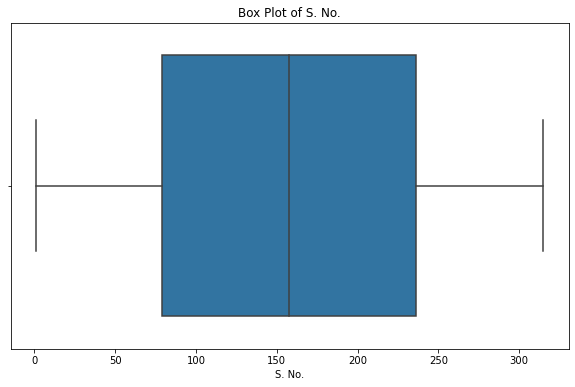

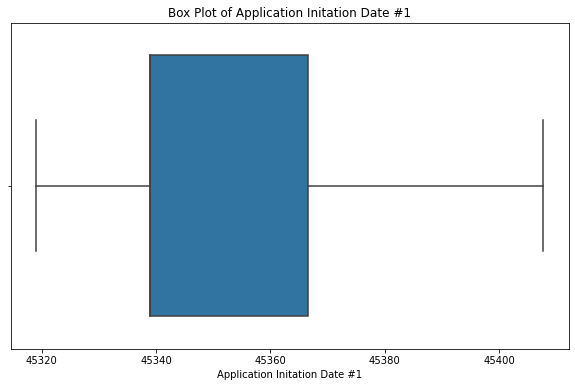

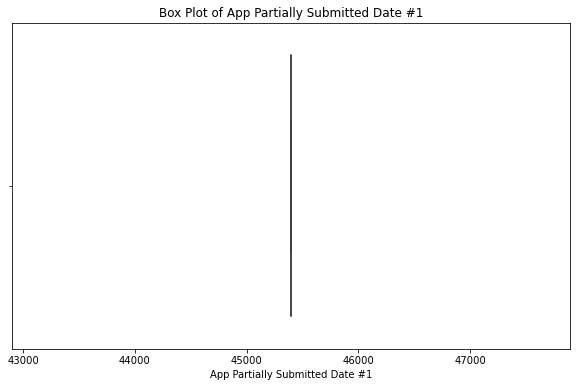

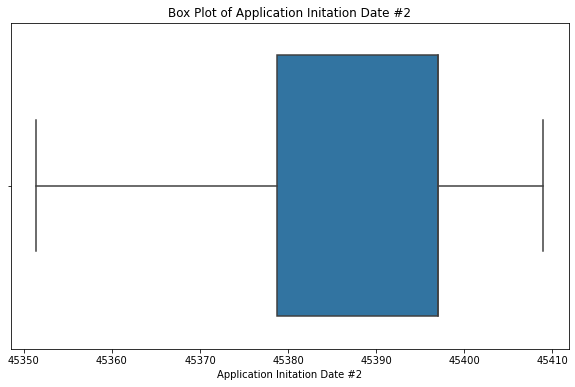

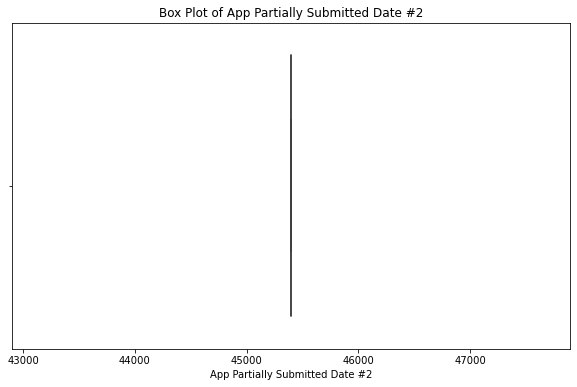

...

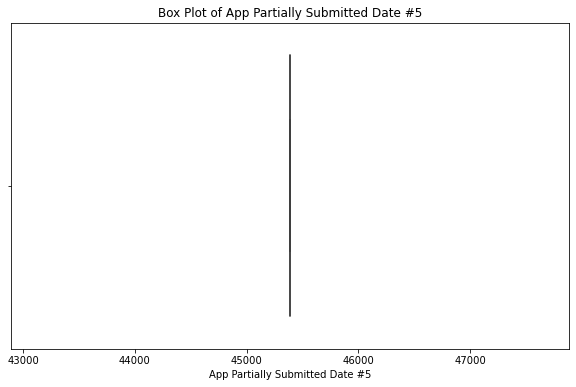

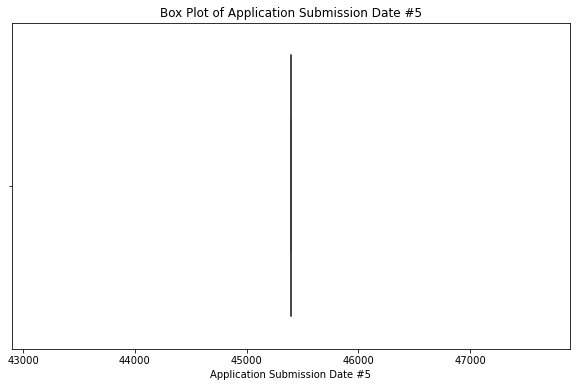

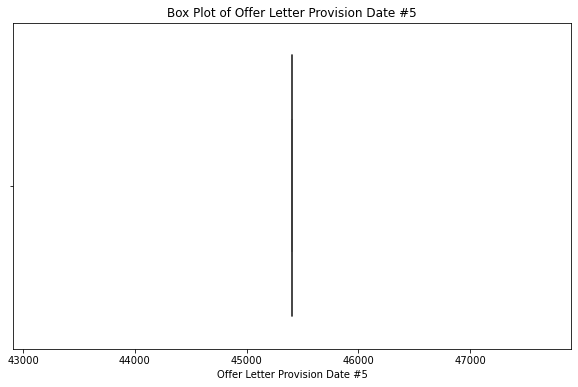

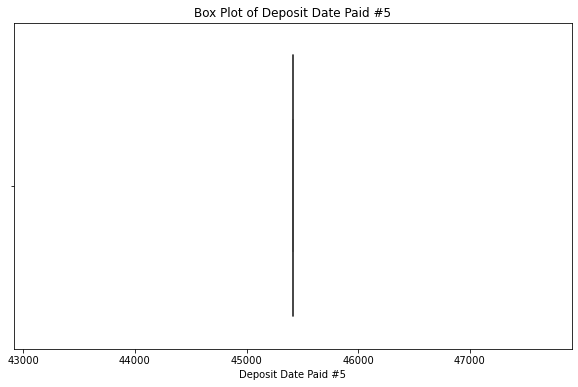

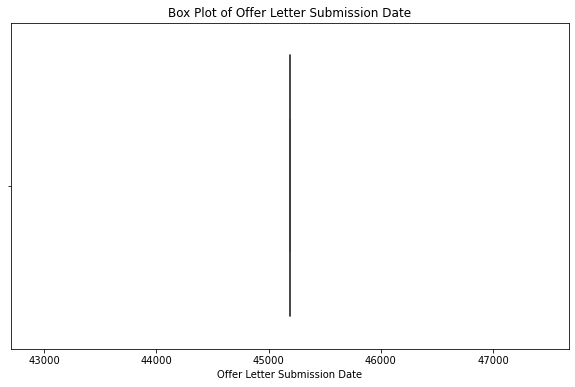

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns

# Numerical columns for box plots
numerical_cols = data.select_dtypes(include=[np.number]).columns

# Create box plots for each numerical column
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=data[col])
    plt.title(f'Box Plot of {col}')
    plt.show()

##### Histograms

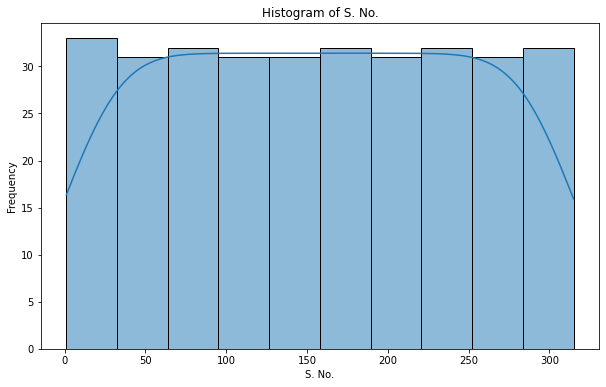

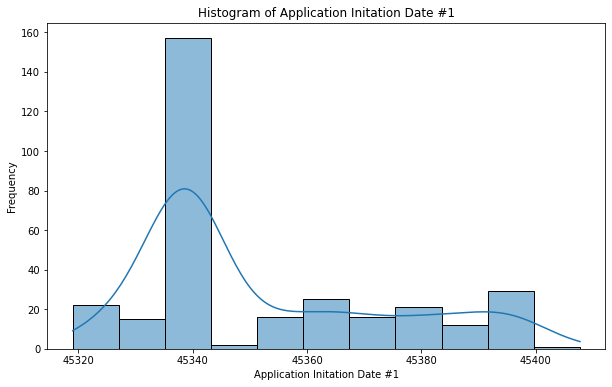

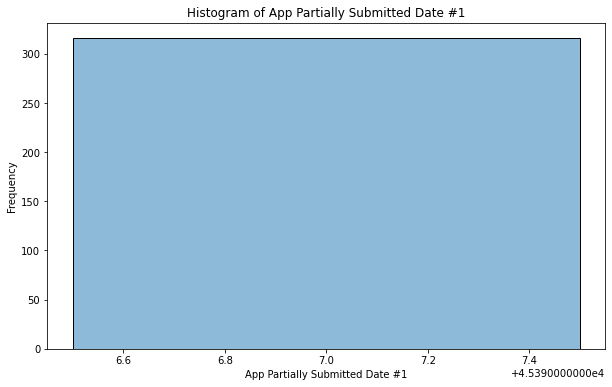

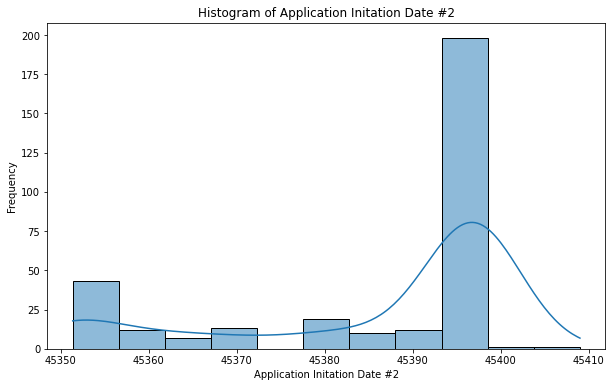

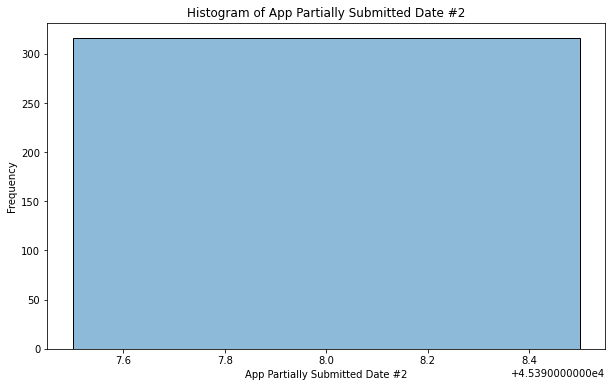

...

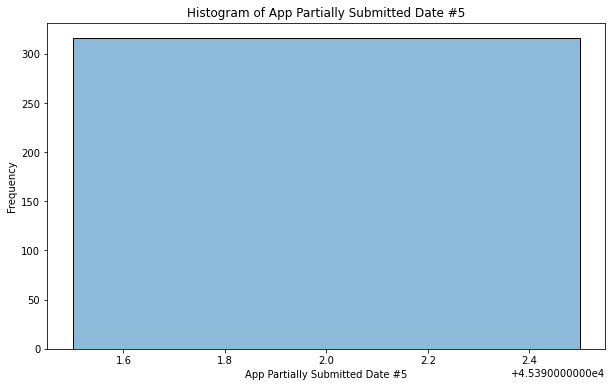

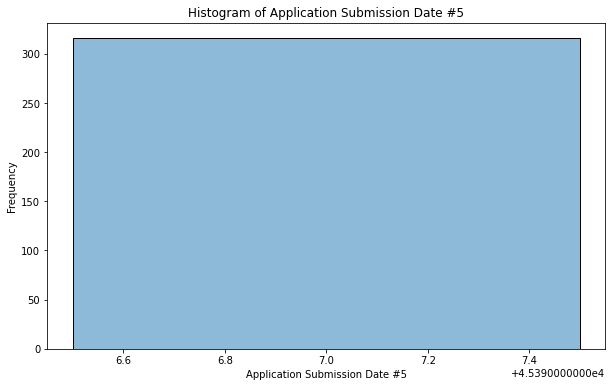

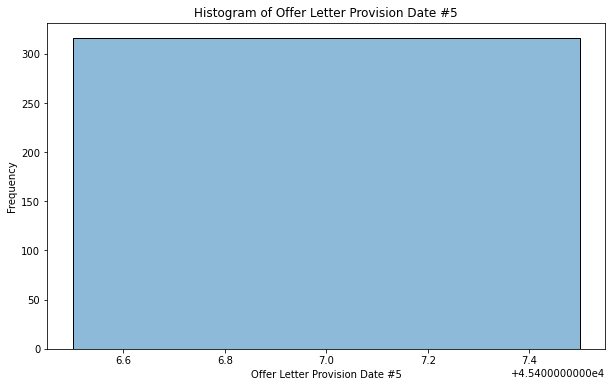

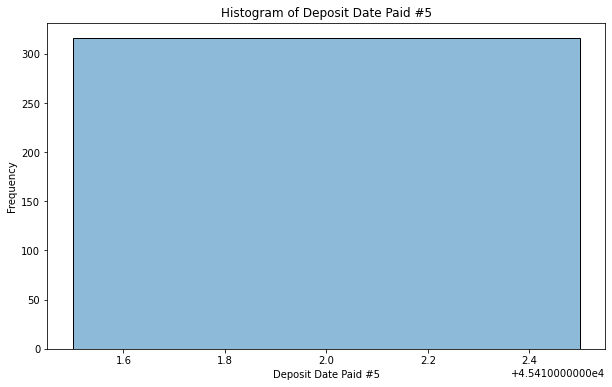

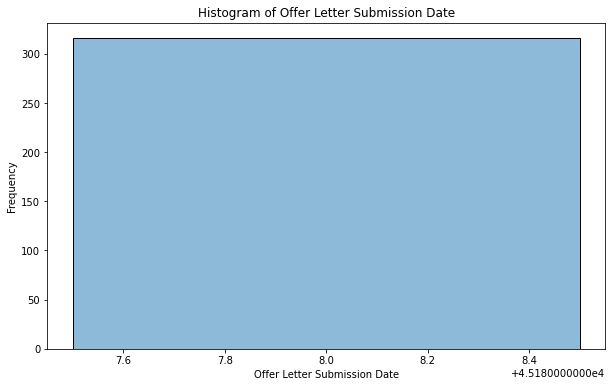

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# Numerical columns for histograms
numerical_cols = data.select_dtypes(include=[np.number]).columns

# Create histograms for each numerical column
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.histplot(data[col], kde=True)  # Include KDE for density plot
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

##### Countplot 

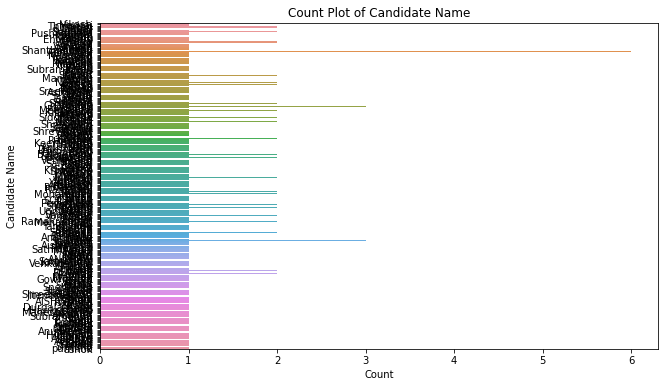

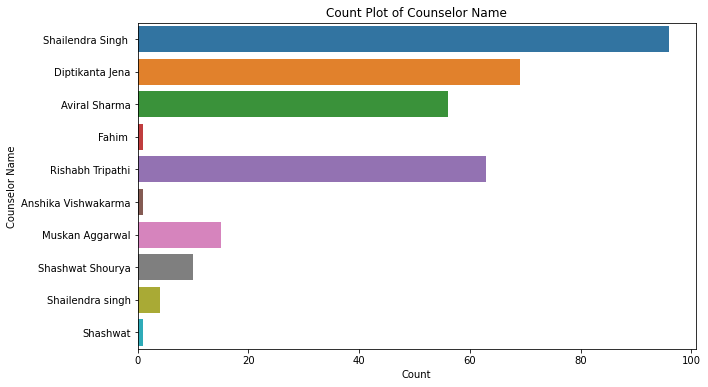

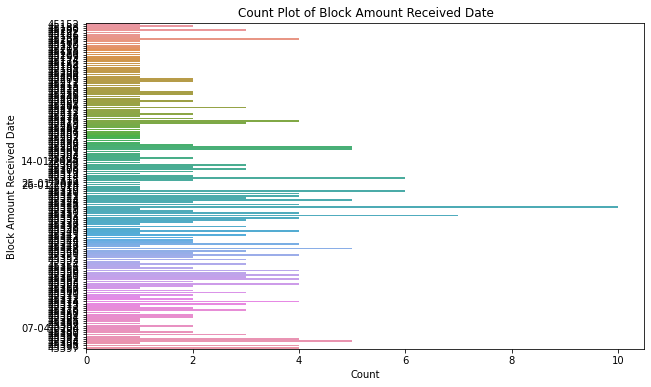

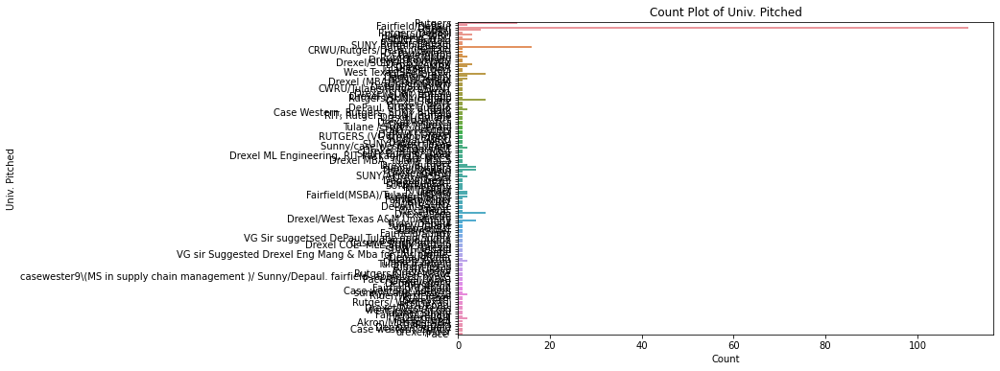

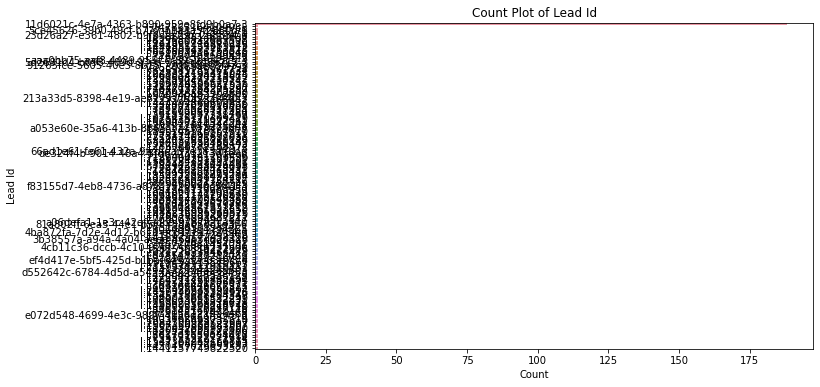

...

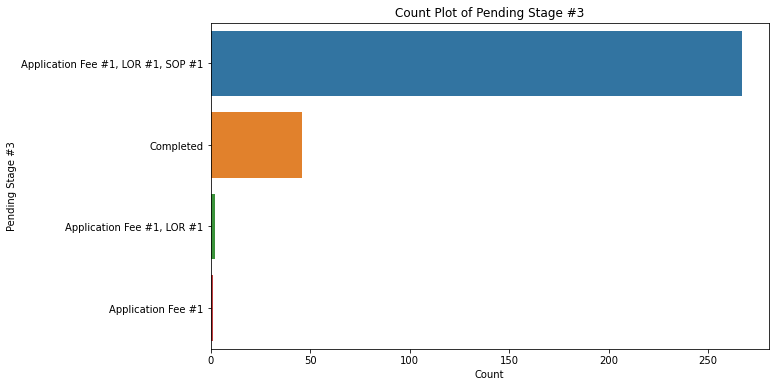

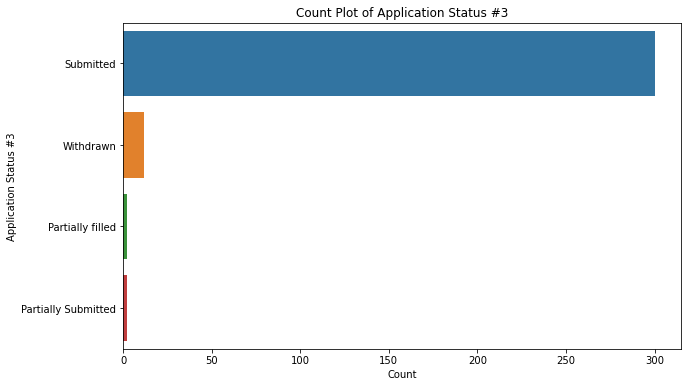

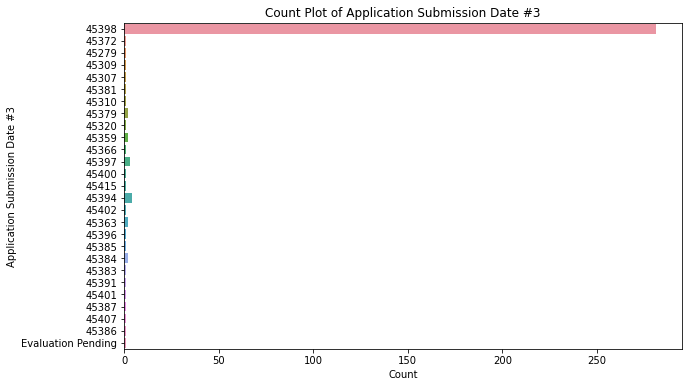

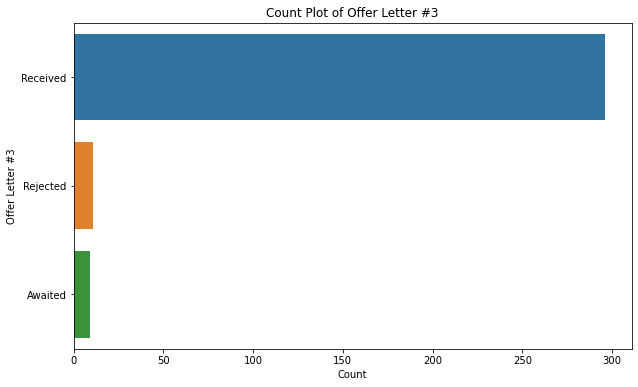

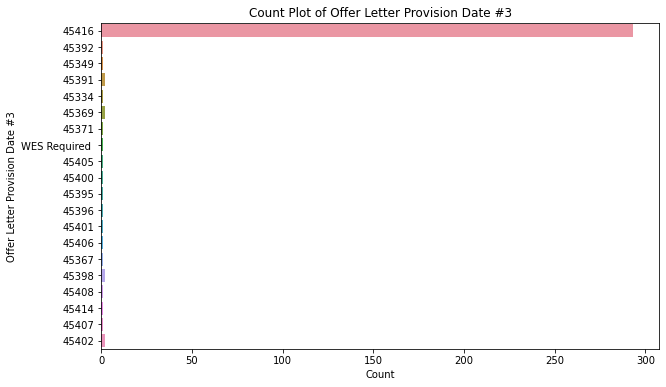

ValueError: min() arg is an empty sequence

<Figure size 720x432 with 0 Axes>

In [36]:
# Categorical columns for count plots
categorical_cols = data.select_dtypes(include=[object]).columns

# Creating count plots for each categorical column
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(y=data[col])  # Use y-axis for better visibility if there are many categories
    plt.title(f'Count Plot of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
    plt.show()

##### Pie Chart 

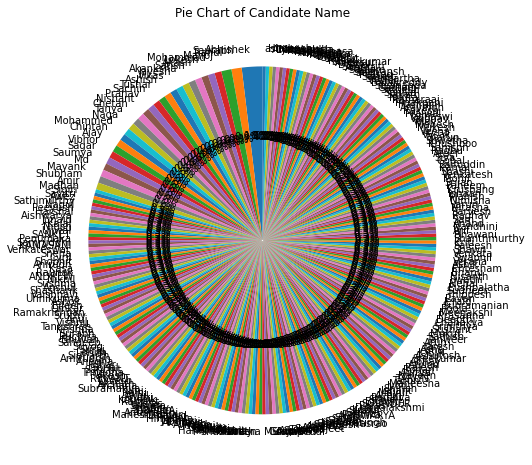

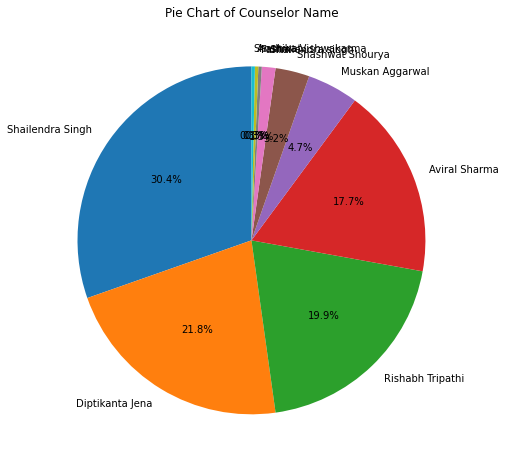

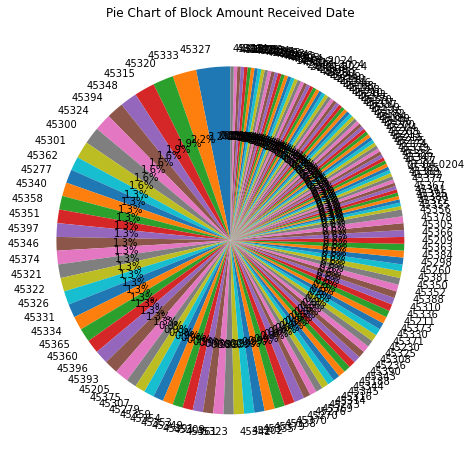

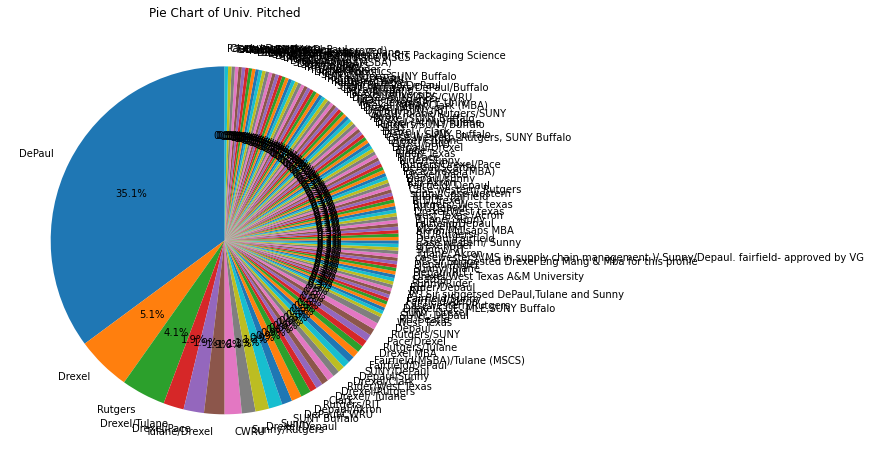

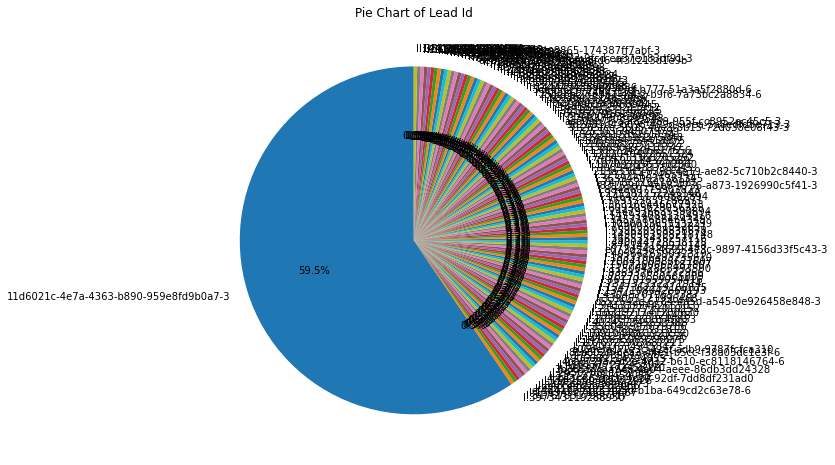

...

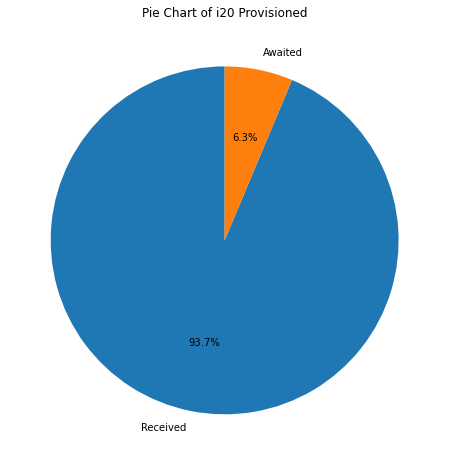

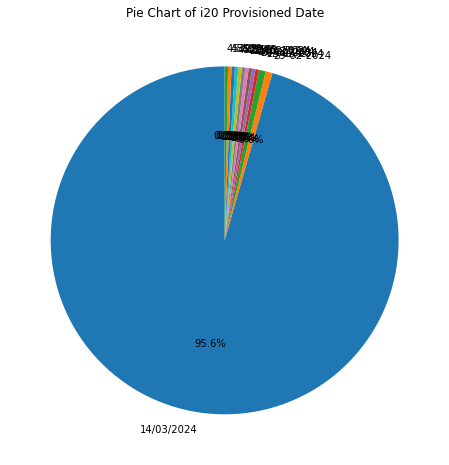

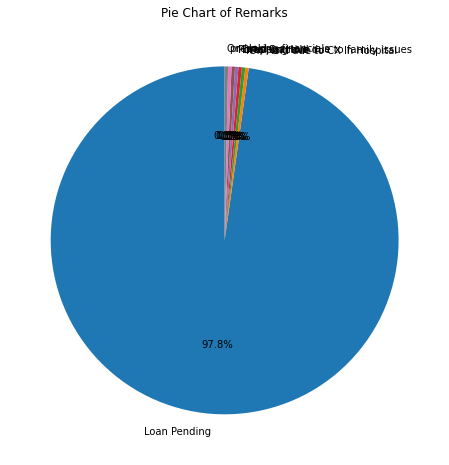

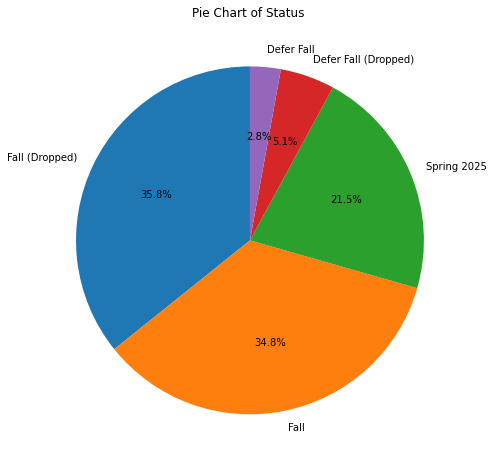

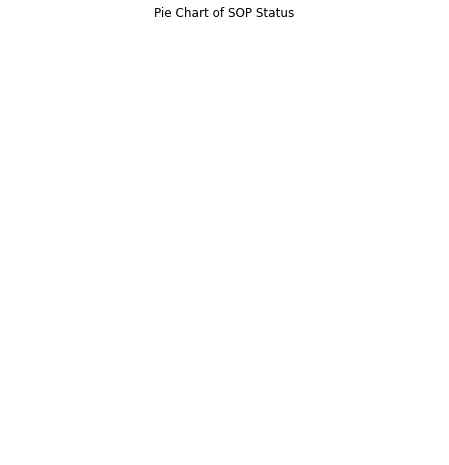

In [37]:
# Pie charts for categorical columns
for col in categorical_cols:
    plt.figure(figsize=(8, 8))
    data[col].value_counts().plot.pie(autopct='%1.1f%%', startangle=90)
    plt.title(f'Pie Chart of {col}')
    plt.ylabel('')  # Hiding the y-label for pie charts
    plt.show()

##### Box Plot: Provides insight into the distribution and outliers for numerical data.

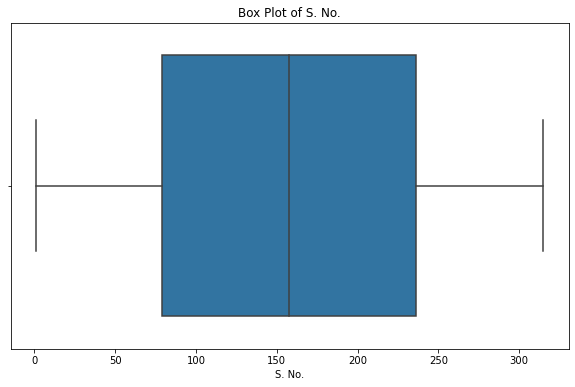

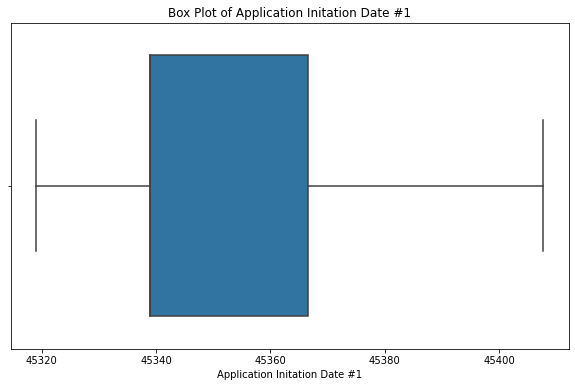

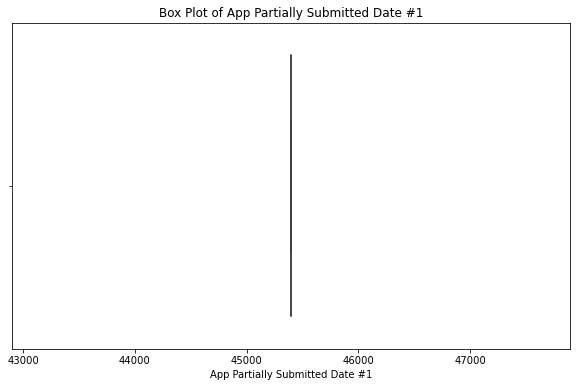

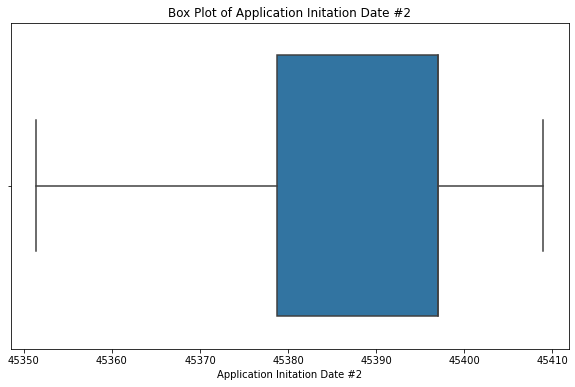

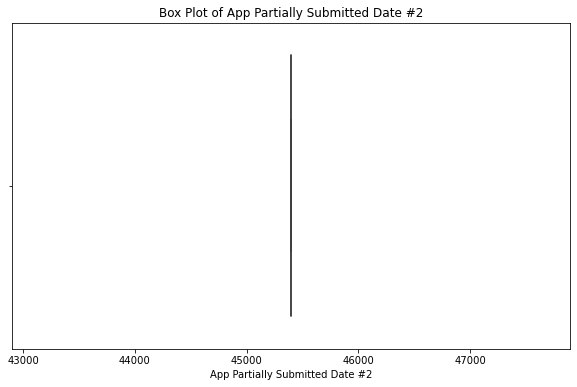

...

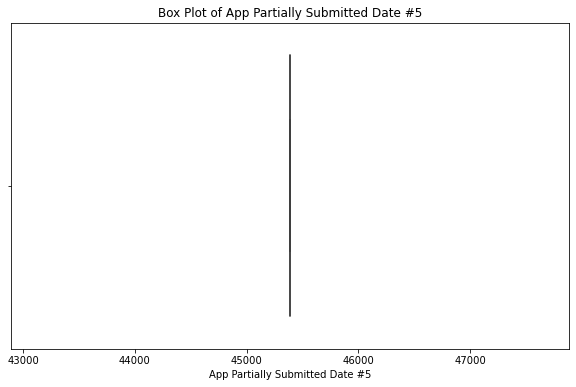

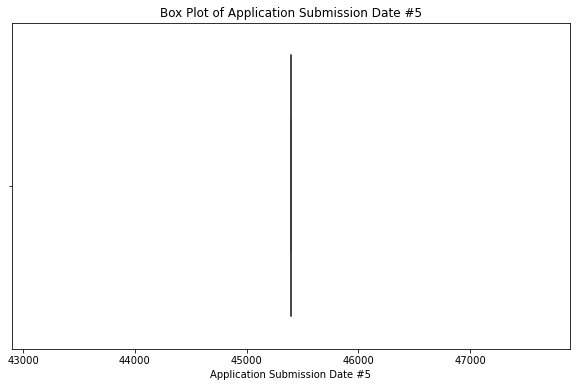

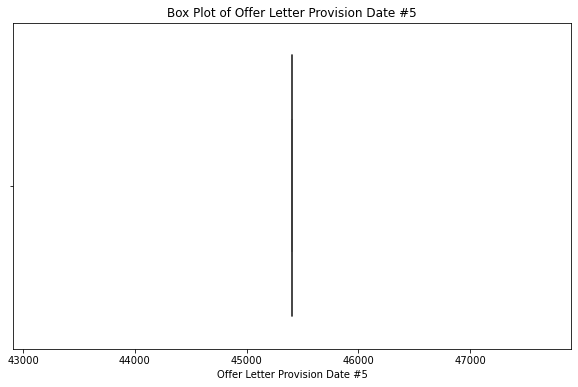

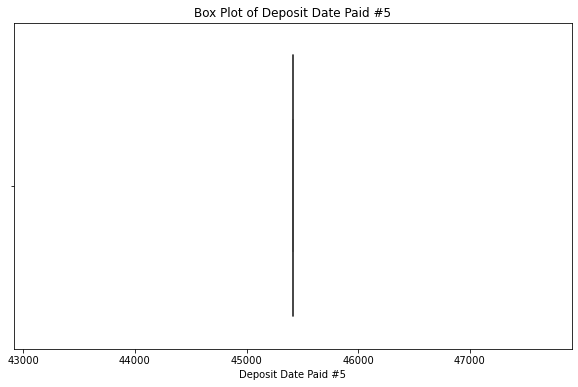

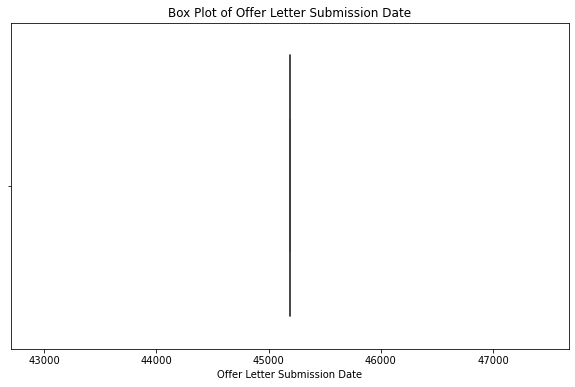

In [39]:
# Create box plots for each numerical column
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=data[col])
    plt.title(f'Box Plot of {col}')
    plt.xlabel(col)
    plt.show()

##### Density Plot

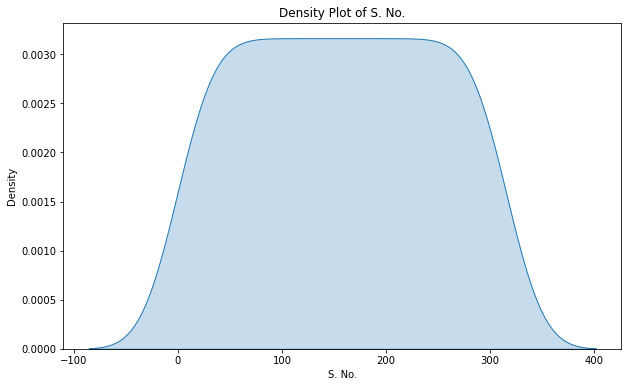

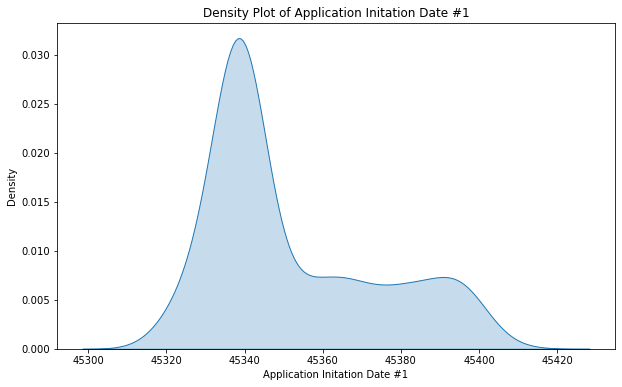

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


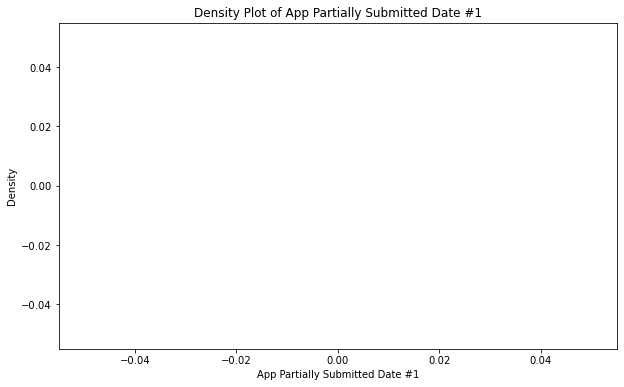

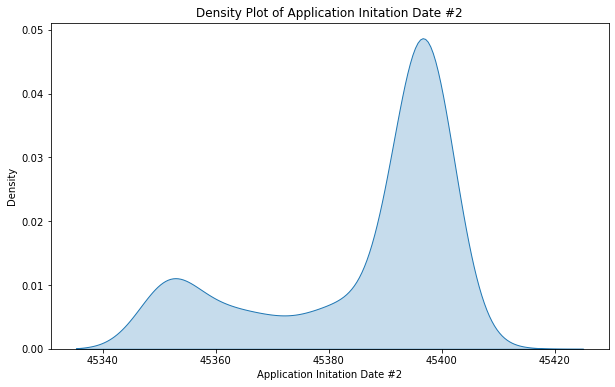

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


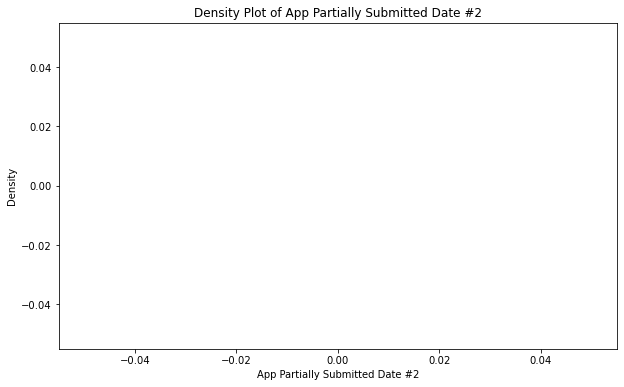

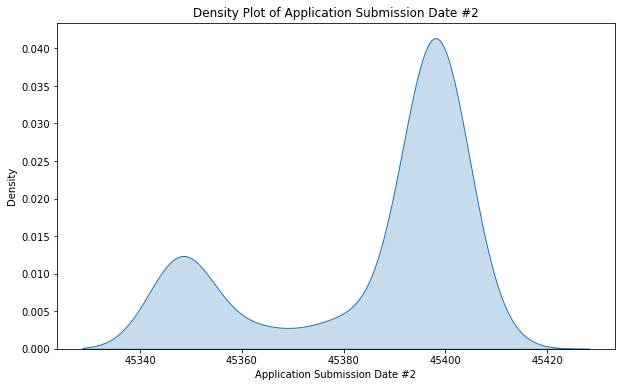

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


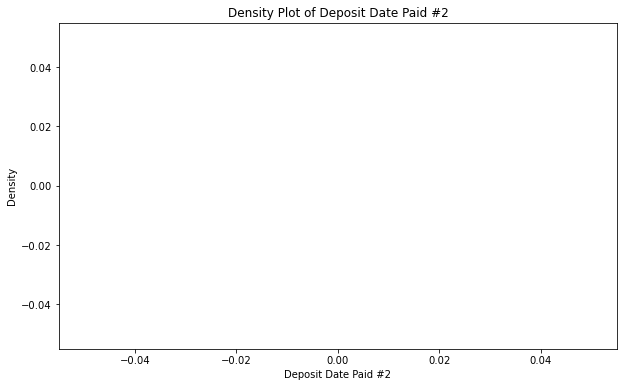

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


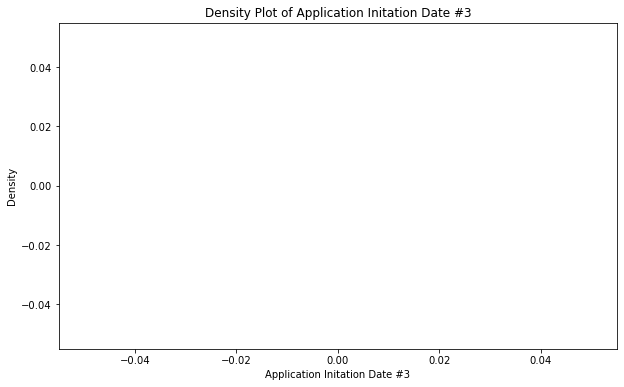

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


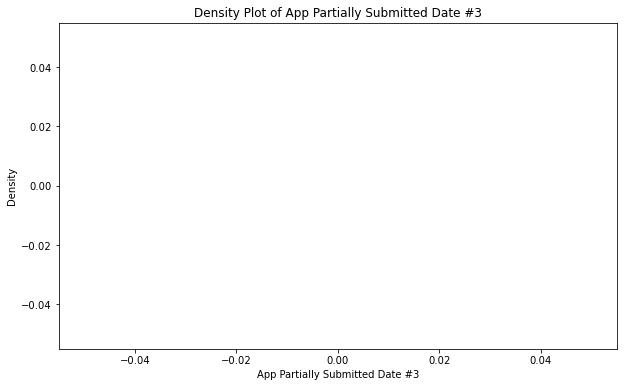

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


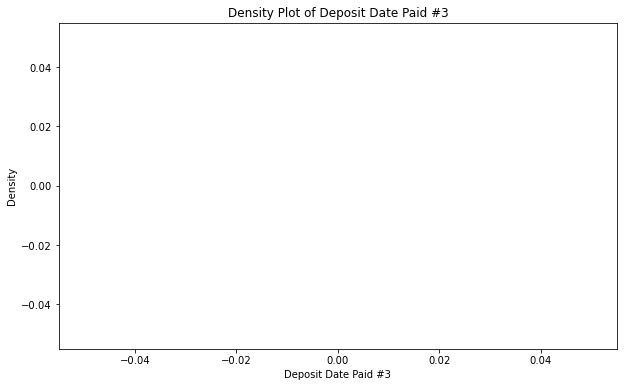

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


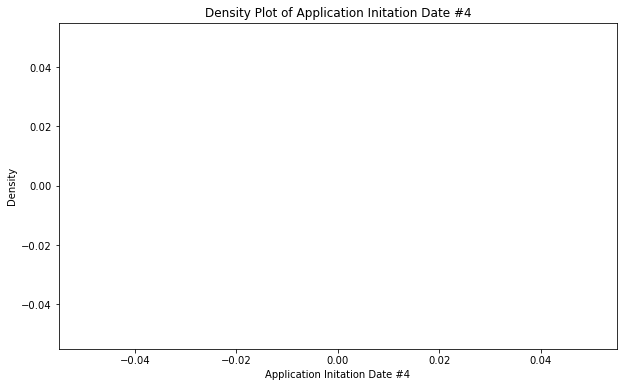

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


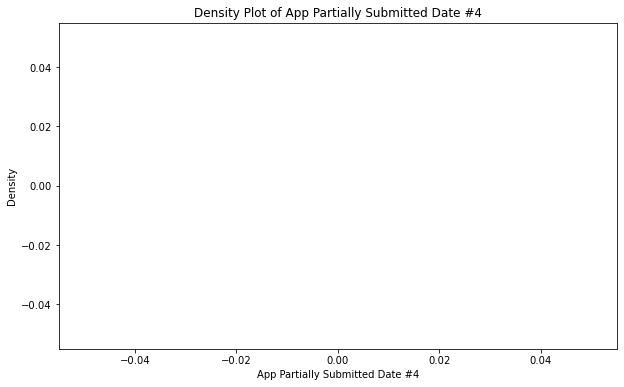

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


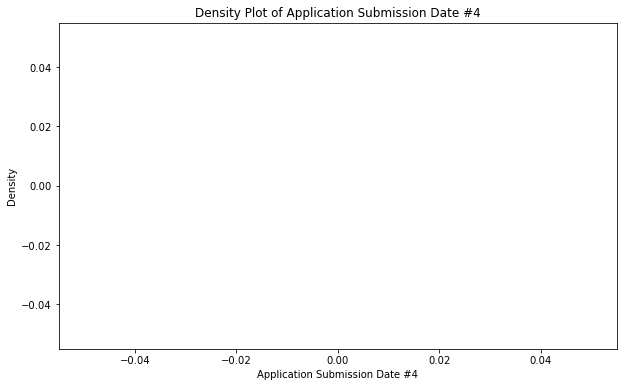

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


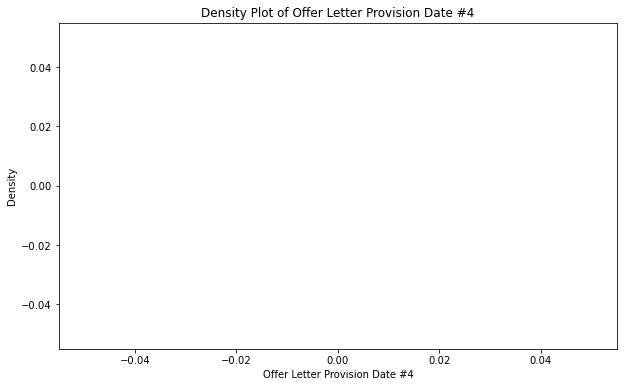

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


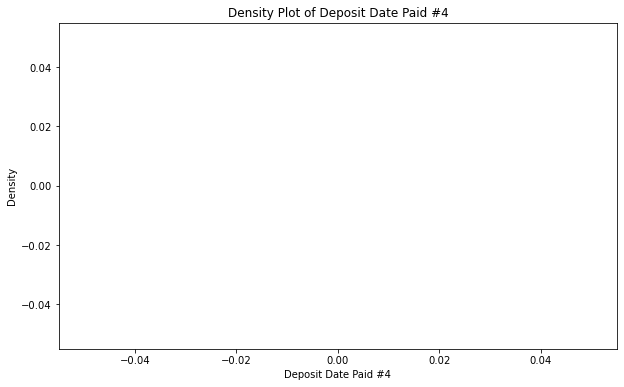

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


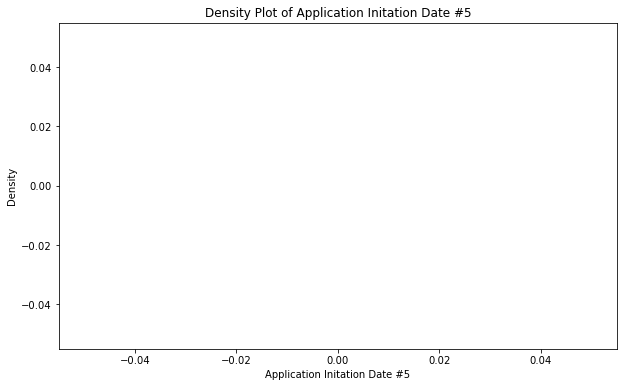

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


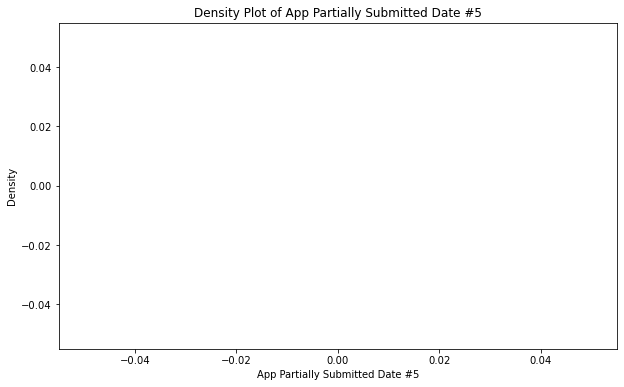

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


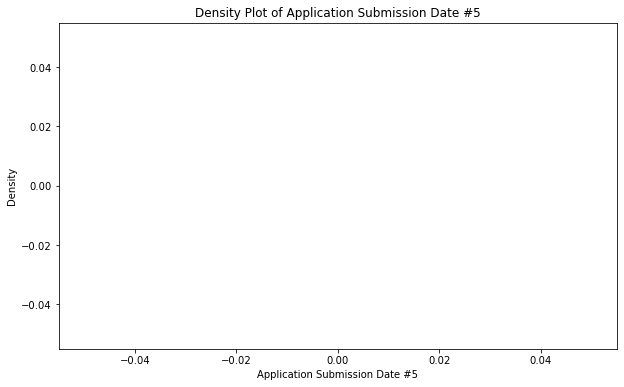

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


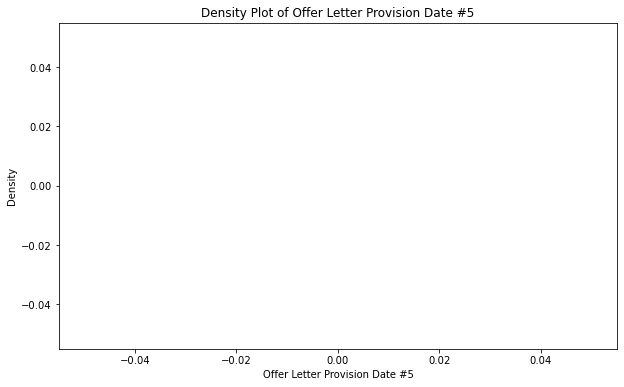

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


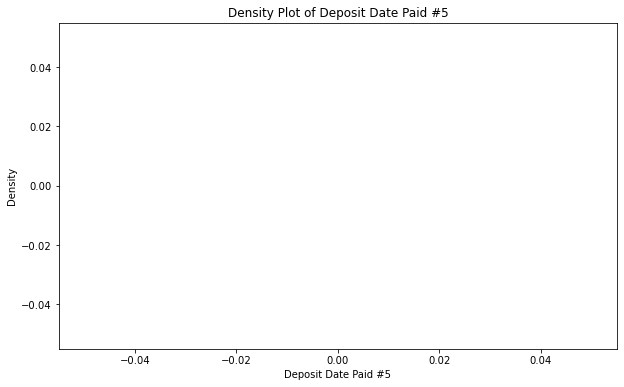

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


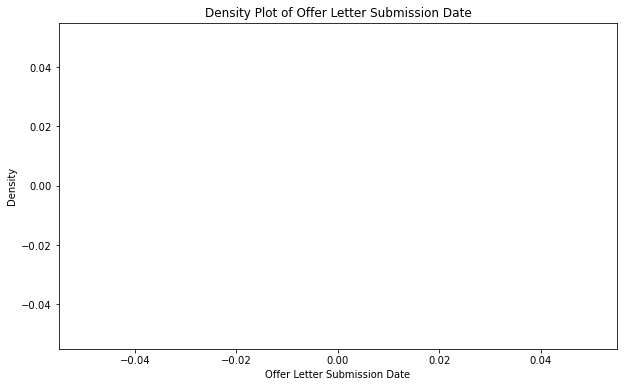

In [40]:
# Create density plots for each numerical column
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.kdeplot(data[col], shade=True)
    plt.title(f'Density Plot of {col}')
    plt.xlabel(col)
    plt.show()

##### BIVARIATE ANALYSIS 

###### Scatter Plot  

C:\Users\HP\AppData\Local\Temp\ipykernel_22668\3706149454.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cleaned['Block Amount Received Date'] = pd.to_datetime(data_cleaned['Block Amount Received Date'], errors='coerce')


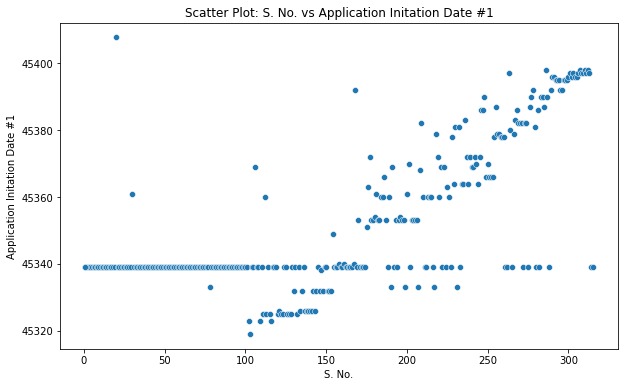

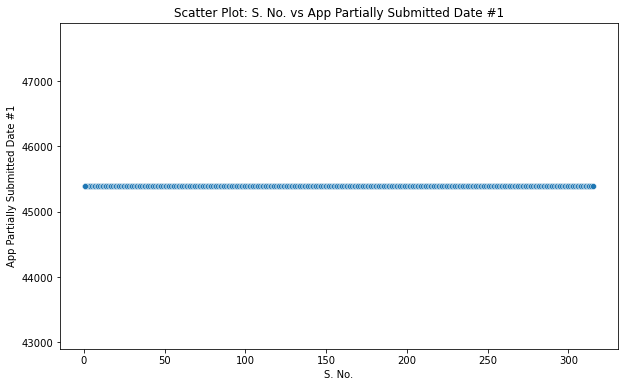

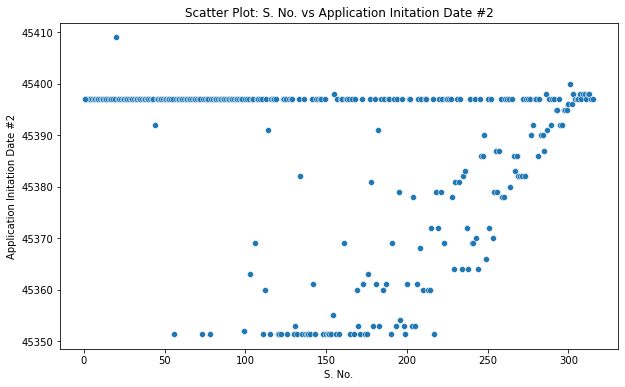

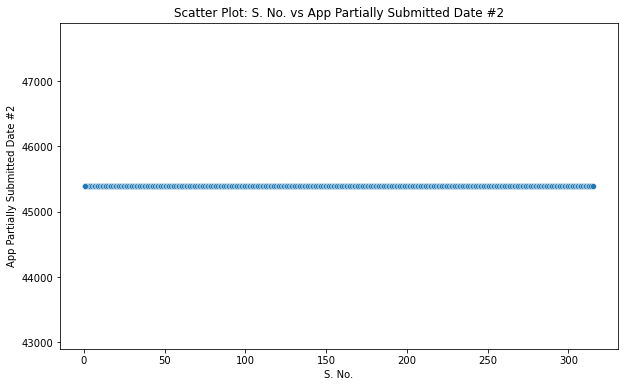

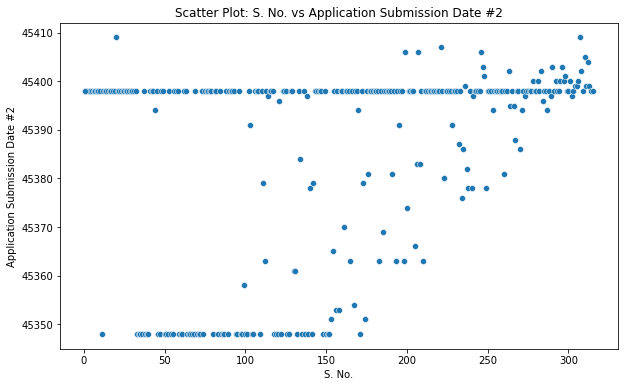

...

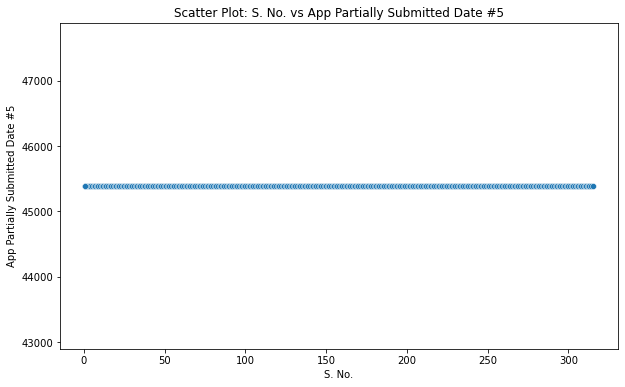

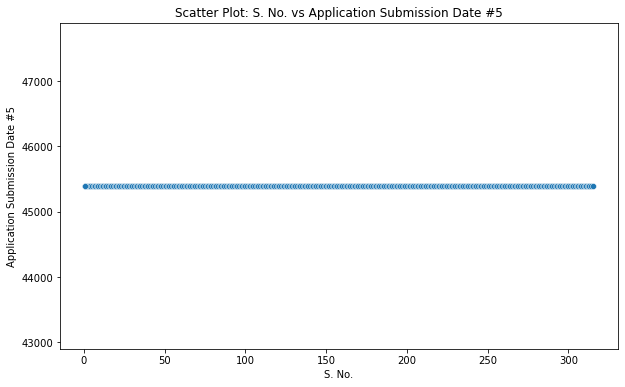

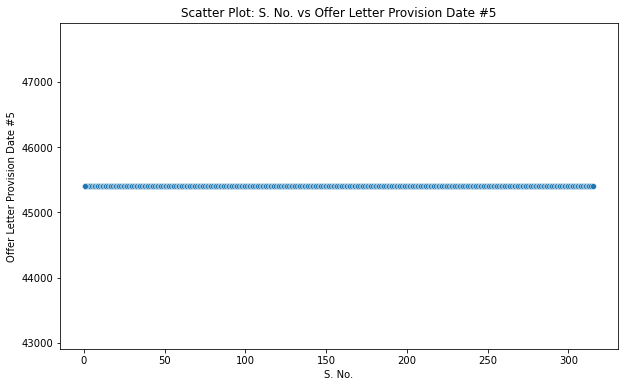

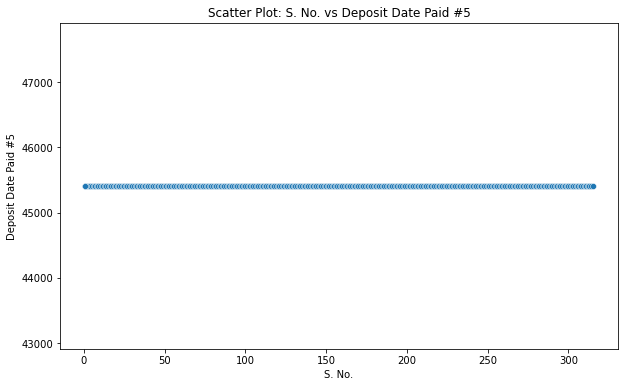

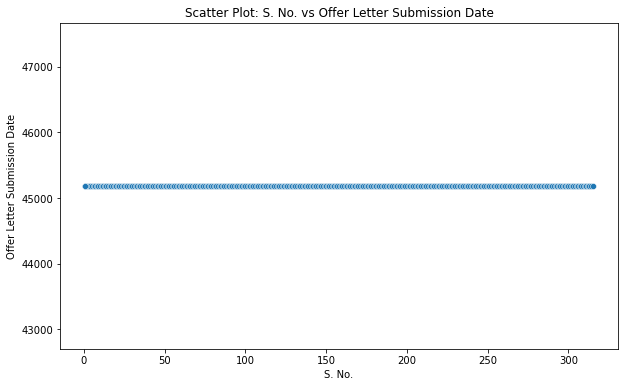

In [52]:
if 'Block Amount Received Date' in data_cleaned.columns:
    data_cleaned['Block Amount Received Date'] = pd.to_datetime(data_cleaned['Block Amount Received Date'], errors='coerce')

numerical_cols = data_cleaned.select_dtypes(include=[np.number]).columns

for col in numerical_cols:
    if col != numerical_cols[0]:
        plt.figure(figsize=(10, 6))
        sns.scatterplot(x=data_cleaned[numerical_cols[0]], y=data_cleaned[col])
        plt.title(f'Scatter Plot: {numerical_cols[0]} vs {col}')
        plt.xlabel(numerical_cols[0])
        plt.ylabel(col)
        plt.show()

##### Correlation and heatmap 

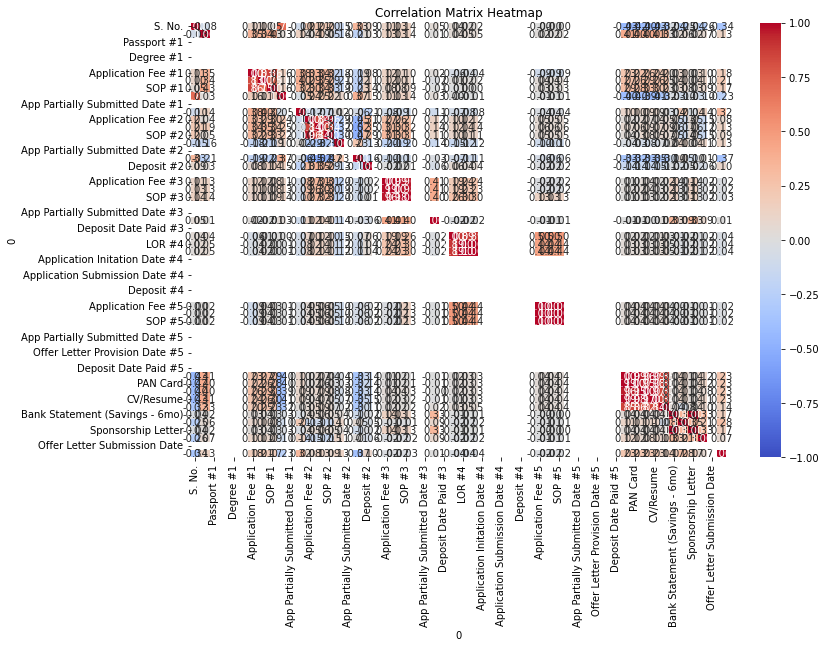

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt

# Computing the correlation matrix
corr_matrix = data.corr()

# Creating a heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Correlation Matrix Heatmap')
plt.show()

In [48]:
print(data.columns)
print(data.head())

Index(['S. No.', 'Candidate Name', 'Counselor Name',
       'Block Amount Received Date', 'Univ. Pitched', 'Lead Id',
       'Candidate Preferred College #1', 'Candidate Preferred College #2',
       '10th Percentage ', '12th Percentange',
       ...
       'Sponsorship Letter', 'Offer Letter', 'Offer Letter Submission Date',
       'Financials Submission', 'Financials Submission Date',
       'i20 Provisioned', 'i20 Provisioned Date', 'Remarks', 'Status ',
       'SOP Status'],
      dtype='object', name=0, length=133)
0  S. No. Candidate Name     Counselor Name Block Amount Received Date  \
1     1.0         Vikash  Shailendra Singh                       45152   
2     2.0        Hariraj  Shailendra Singh                       45188   
3     3.0       Thippesh  Shailendra Singh                       45190   
4     4.0        Chintan  Shailendra Singh                       45202   
5     5.0          Sagar  Shailendra Singh                       45181   

0     Univ. Pitched          

In [12]:
print(data_cleaned.columns)

Index(['S. No.', 'Candidate Name', 'Counselor Name',
       'Block Amount Received Date', 'Univ. Pitched', 'Lead Id',
       'Candidate Preferred College #1', 'Candidate Preferred College #2',
       '10th Percentage ', '12th Percentange', 'UG - CGPA (out of 10) ',
       'GPA (Out of 4)', 'PG - CGPA or %', 'Work Exp.', 'Highest Education',
       'Designation - Company Name ', 'Candidate Application Status',
       'Candidate Loan Status', 'Remarks - General', 'Reason for dropping',
       'KYC & Acad Documents Received', 'Tech Exam Scores',
       'Coding Test Score', 'English Exam Scores', 'Exam Taking Date',
       'English Interview Score (15)', 'Tech. interview Score (10)',
       'Application Type', 'Intake Status', 'Choice of School #1',
       'Choice of Program #1', 'Passport #1', 'Resume #1', 'Degree #1',
       'Transcript #1', 'Application Fee #1', 'LOR #1', 'SOP #1',
       'Pending Stage #1', 'Application Status #1',
       'Application Initation Date #1', 'App Partially

C:\Users\HP\AppData\Local\Temp\ipykernel_22668\3404293095.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cleaned[column].fillna(data_cleaned[column].median(), inplace=True)
C:\Users\HP\AppData\Local\Temp\ipykernel_22668\3404293095.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cleaned[column].fillna(data_cleaned[column].mode()[0], inplace=True)
C:\Users\HP\AppData\Local\Temp\ipykernel_22668\3404293095.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Correlation Matrix:
                                   S. No.  KYC & Acad Documents Received  \
S. No.                           1.000000                      -0.098960   
KYC & Acad Documents Received   -0.098960                       1.000000   
Passport #1                           NaN                            NaN   
Resume #1                             NaN                            NaN   
Degree #1                             NaN                            NaN   
Transcript #1                         NaN                            NaN   
Application Fee #1               0.114214                       0.347342   
LOR #1                           0.104151                       0.344472   
SOP #1                           0.048277                       0.427140   
Application Initation Date #1    0.405371                      -0.098809   
App Partially Submitted Date #1  0.269967                      -0.100726   
Deposit #1                      -0.101637                       0.13

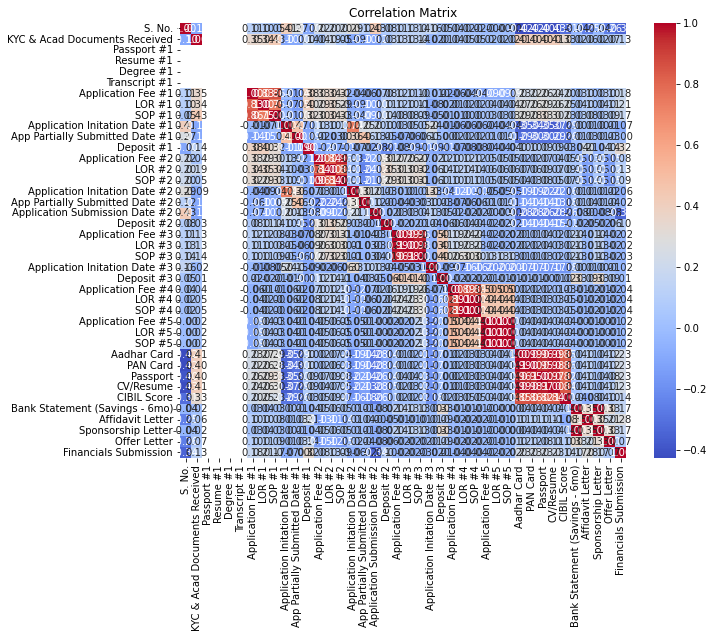

In [16]:
threshold = 0.90
data_cleaned = data.loc[:, data.isnull().mean() < threshold]

# Step 2: Impute missing values
for column in data_cleaned.select_dtypes(include=['float64', 'int64']).columns:
    data_cleaned[column].fillna(data_cleaned[column].median(), inplace=True)
   
for column in data_cleaned.select_dtypes(include=['object']).columns:
    data_cleaned[column].fillna(data_cleaned[column].mode()[0], inplace=True)

# Step 3: Convert data types (example)
data_cleaned['Block Amount Received Date'] = pd.to_datetime(data_cleaned['Block Amount Received Date'], errors='coerce')

# Step 4: Bivariate Analysis

# 1. Correlation Matrix
corr_matrix = data_cleaned.corr()
print("Correlation Matrix:")
print(corr_matrix)

# Visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

###### MULTIVARIATE ANALYSIS 

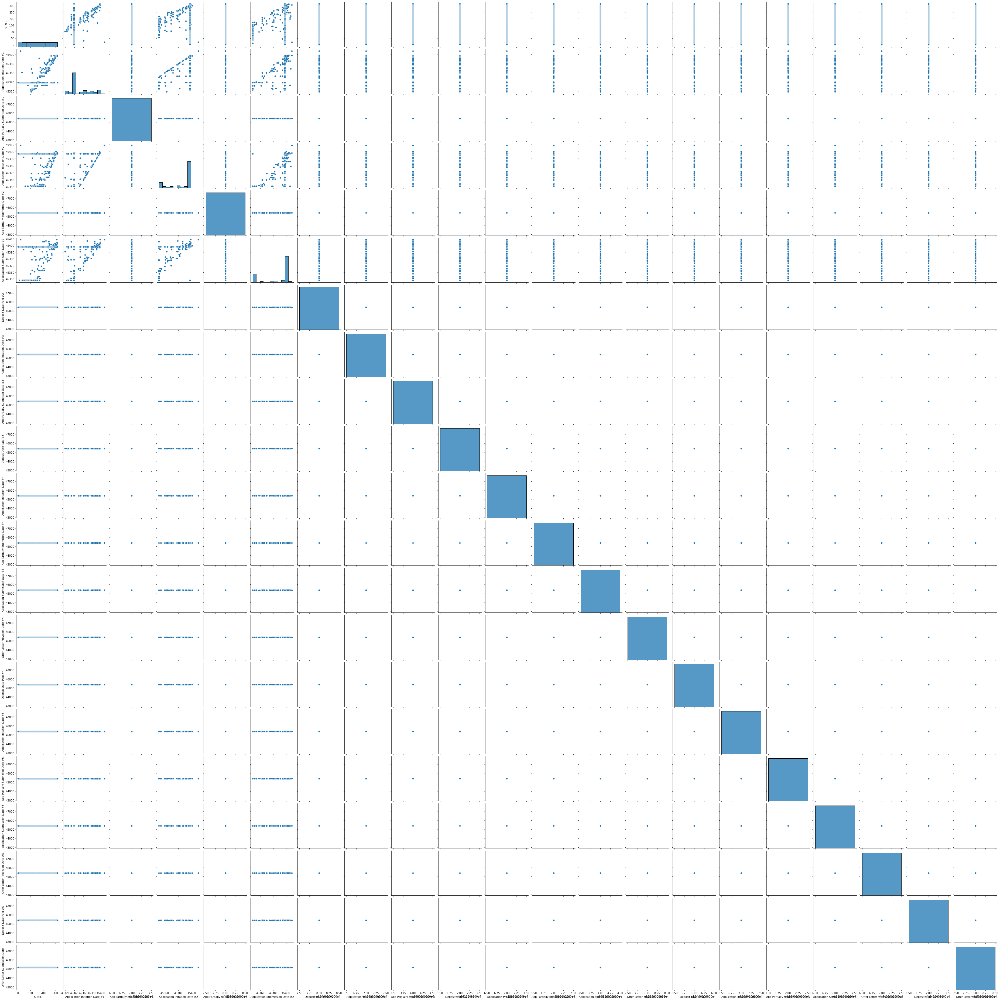

In [49]:
# Multivariate Analysis
#Pair plot for numerical features
sns.pairplot(data_cleaned[numerical_cols])
plt.show()

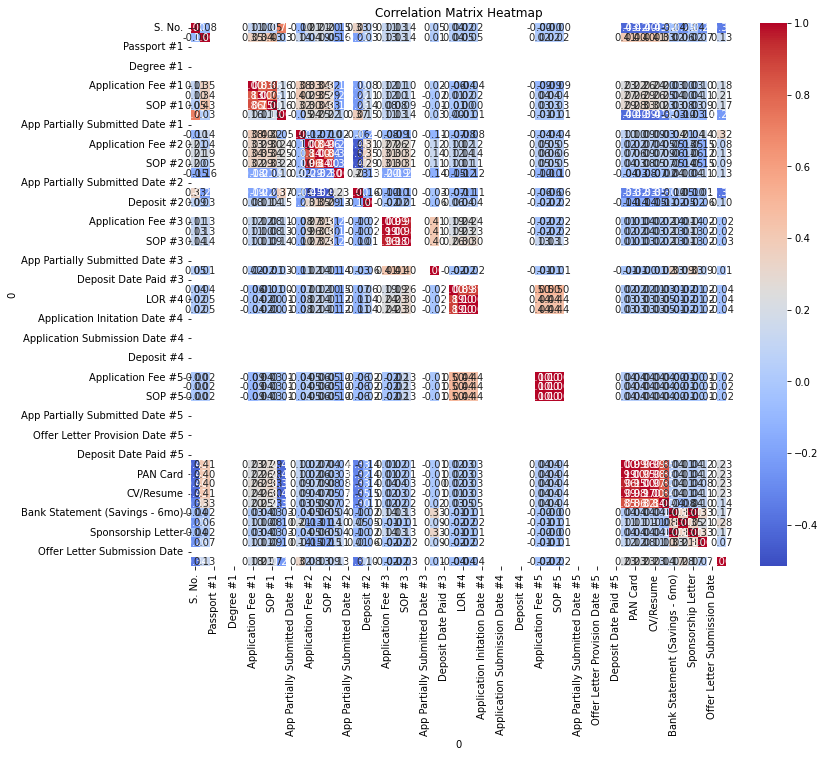

In [50]:
#Heatmap of correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap')
plt.show()